# Black Friday Sales Data Exploratory Analysis using PySpark

## Import Dataset

In [0]:
file_location = "/Volumes/workspace/default/eda_project/train.csv"

df = spark.read.format("csv") \
    .option("header", "true") \
    .option("inferSchema", "false") \
    .option("sep", ",") \
    .load(file_location)

display(df)

User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
1000001,P00069042,F,0-17,10,A,2,0,3,null,null,8370
1000001,P00248942,F,0-17,10,A,2,0,1,6,14,15200
1000001,P00087842,F,0-17,10,A,2,0,12,null,null,1422
1000001,P00085442,F,0-17,10,A,2,0,12,14,null,1057
1000002,P00285442,M,55+,16,C,4+,0,8,null,null,7969
1000003,P00193542,M,26-35,15,A,3,0,1,2,null,15227
1000004,P00184942,M,46-50,7,B,2,1,1,8,17,19215
1000004,P00346142,M,46-50,7,B,2,1,1,15,null,15854
1000004,P0097242,M,46-50,7,B,2,1,1,16,null,15686
1000005,P00274942,M,26-35,20,A,1,1,8,null,null,7871


In [0]:
df.printSchema()


root
 |-- User_ID: string (nullable = true)
 |-- Product_ID: string (nullable = true)
 |-- Gender: string (nullable = true)
 |-- Age: string (nullable = true)
 |-- Occupation: string (nullable = true)
 |-- City_Category: string (nullable = true)
 |-- Stay_In_Current_City_Years: string (nullable = true)
 |-- Marital_Status: string (nullable = true)
 |-- Product_Category_1: string (nullable = true)
 |-- Product_Category_2: string (nullable = true)
 |-- Product_Category_3: string (nullable = true)
 |-- Purchase: string (nullable = true)



## Modify Data Types for Table

In [0]:
from pyspark.sql.types import *
new_schema = StructType([
    StructField("User_ID", IntegerType(), True),
    StructField("Product_ID", StringType(), True),
    StructField("Gender", StringType(), True),
    StructField("Age", StringType(), True),
    StructField("Occupation", IntegerType(), True),
    StructField("City_Category", StringType(), True),
    StructField("Stay_In_Current_City_Years", StringType(), True),
    StructField("Marital_Status", StringType(), True),
    StructField("Product_Category_1", IntegerType(), True),
    StructField("Product_Category_2", IntegerType(), True),
    StructField("Product_Category_3", IntegerType(), True),
    StructField("Purchase", IntegerType(), True)
])

file_location = "/Volumes/workspace/default/eda_project/train.csv"

df = spark.read.format("csv") \
    .option("header", "true") \
    .option("inferSchema", "false") \
    .option("sep", ",") \
    .schema(new_schema) \
    .load(file_location)

display(df)


User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
1000001,P00069042,F,0-17,10,A,2,0,3,null,null,8370
1000001,P00248942,F,0-17,10,A,2,0,1,6,14,15200
1000001,P00087842,F,0-17,10,A,2,0,12,null,null,1422
1000001,P00085442,F,0-17,10,A,2,0,12,14,null,1057
1000002,P00285442,M,55+,16,C,4+,0,8,null,null,7969
1000003,P00193542,M,26-35,15,A,3,0,1,2,null,15227
1000004,P00184942,M,46-50,7,B,2,1,1,8,17,19215
1000004,P00346142,M,46-50,7,B,2,1,1,15,null,15854
1000004,P0097242,M,46-50,7,B,2,1,1,16,null,15686
1000005,P00274942,M,26-35,20,A,1,1,8,null,null,7871


In [0]:
df.printSchema()

root
 |-- User_ID: integer (nullable = true)
 |-- Product_ID: string (nullable = true)
 |-- Gender: string (nullable = true)
 |-- Age: string (nullable = true)
 |-- Occupation: integer (nullable = true)
 |-- City_Category: string (nullable = true)
 |-- Stay_In_Current_City_Years: string (nullable = true)
 |-- Marital_Status: string (nullable = true)
 |-- Product_Category_1: integer (nullable = true)
 |-- Product_Category_2: integer (nullable = true)
 |-- Product_Category_3: integer (nullable = true)
 |-- Purchase: integer (nullable = true)



In [0]:
print("Number of Rows : ", df.count())

Number of Rows :  550068


In [0]:
cols_to_describe = ["Stay_In_Current_City_Years", "Marital_Status", "Product_Category_1", "Product_Category_2", "Product_Category_3", "Purchase"]

for col in cols_to_describe:
     df.describe([col]).show()

+-------+--------------------------+
|summary|Stay_In_Current_City_Years|
+-------+--------------------------+
|  count|                    550068|
|   mean|         1.468494139793958|
| stddev|        0.9890866807573191|
|    min|                         0|
|    max|                        4+|
+-------+--------------------------+

+-------+-------------------+
|summary|     Marital_Status|
+-------+-------------------+
|  count|             550068|
|   mean|0.40965298835780306|
| stddev|0.49177012631732997|
|    min|                  0|
|    max|                  1|
+-------+-------------------+

+-------+------------------+
|summary|Product_Category_1|
+-------+------------------+
|  count|            550068|
|   mean| 5.404270017525106|
| stddev|3.9362113692013896|
|    min|                 1|
|    max|                20|
+-------+------------------+

+-------+------------------+
|summary|Product_Category_2|
+-------+------------------+
|  count|            376430|
|   mean| 9.84232

## Data Cleaning

In [0]:
# Find Missing Values
from pyspark.sql.functions import col, count, when
df.select([count(when(col(c).isNull(), c)).alias(c) for c in df.columns]).show()



+-------+----------+------+---+----------+-------------+--------------------------+--------------+------------------+------------------+------------------+--------+
|User_ID|Product_ID|Gender|Age|Occupation|City_Category|Stay_In_Current_City_Years|Marital_Status|Product_Category_1|Product_Category_2|Product_Category_3|Purchase|
+-------+----------+------+---+----------+-------------+--------------------------+--------------+------------------+------------------+------------------+--------+
|      0|         0|     0|  0|         0|            0|                         0|             0|                 0|            173638|            383247|       0|
+-------+----------+------+---+----------+-------------+--------------------------+--------------+------------------+------------------+------------------+--------+



In [0]:
# Relceaing missing values with 0
df = df.fillna({
    "Product_Category_2": 0,
    "Product_Category_3": 0
})


In [0]:
# Checking for missing values result
from pyspark.sql.functions import col, count, when
df.select([count(when(col(c).isNull(), c)).alias(c) for c in df.columns]).show()

+-------+----------+------+---+----------+-------------+--------------------------+--------------+------------------+------------------+------------------+--------+
|User_ID|Product_ID|Gender|Age|Occupation|City_Category|Stay_In_Current_City_Years|Marital_Status|Product_Category_1|Product_Category_2|Product_Category_3|Purchase|
+-------+----------+------+---+----------+-------------+--------------------------+--------------+------------------+------------------+------------------+--------+
|      0|         0|     0|  0|         0|            0|                         0|             0|                 0|                 0|                 0|       0|
+-------+----------+------+---+----------+-------------+--------------------------+--------------+------------------+------------------+------------------+--------+



In [0]:
display(df)

User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
1000001,P00069042,F,0-17,10,A,2,0,3,0,0,8370
1000001,P00248942,F,0-17,10,A,2,0,1,6,14,15200
1000001,P00087842,F,0-17,10,A,2,0,12,0,0,1422
1000001,P00085442,F,0-17,10,A,2,0,12,14,0,1057
1000002,P00285442,M,55+,16,C,4+,0,8,0,0,7969
1000003,P00193542,M,26-35,15,A,3,0,1,2,0,15227
1000004,P00184942,M,46-50,7,B,2,1,1,8,17,19215
1000004,P00346142,M,46-50,7,B,2,1,1,15,0,15854
1000004,P0097242,M,46-50,7,B,2,1,1,16,0,15686
1000005,P00274942,M,26-35,20,A,1,1,8,0,0,7871


In [0]:
# Removing duplicates based on User_ID and Product_ID
df = df.dropDuplicates(["User_ID"])
# Checking
display(df)

User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
1001404,P00370642,M,51-55,16,B,1,1,8,16,0,5902
1003754,P00319042,M,55+,7,C,1,1,5,0,0,8901
1005159,P00025442,M,36-45,7,C,3,0,1,2,9,19640
1000914,P00113642,F,36-45,9,C,2,0,8,0,0,9875
1005225,P00334242,M,18-25,4,C,4+,1,1,8,0,19055
1005571,P00272842,F,26-35,9,C,2,0,5,14,0,6992
1002612,P00003442,F,46-50,3,C,1,1,4,5,8,3422
1000868,P00367542,M,51-55,17,C,4+,0,5,0,0,5425
1001712,P00132842,M,26-35,0,B,4+,0,1,5,0,8075
1003198,P00209742,M,26-35,12,A,1,0,1,11,15,19413


In [0]:
# Number of Rows after removing duplicates
print("Number of Rows : ", df.count())


Number of Rows :  5891


In [0]:
# Update Marital_Status and Gender values for clarity
df = df.withColumn(
    "Marital_Status",
    F.when(F.col("Marital_Status") == "1", "Married")
     .otherwise("Single")
)

df = df.withColumn(
    "Gender",
    F.when(F.col("Gender") == "M", "Male")
     .when(F.col("Gender") == "F", "Female")
     .otherwise(F.col("Gender"))
)

display(df)

User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
1001404,P00370642,Male,51-55,16,B,1,Married,8,16,0,5902
1003754,P00319042,Male,55+,7,C,1,Married,5,0,0,8901
1005159,P00025442,Male,36-45,7,C,3,Single,1,2,9,19640
1000914,P00113642,Female,36-45,9,C,2,Single,8,0,0,9875
1005225,P00334242,Male,18-25,4,C,4+,Married,1,8,0,19055
1005571,P00272842,Female,26-35,9,C,2,Single,5,14,0,6992
1002612,P00003442,Female,46-50,3,C,1,Married,4,5,8,3422
1000868,P00367542,Male,51-55,17,C,4+,Single,5,0,0,5425
1001712,P00132842,Male,26-35,0,B,4+,Single,1,5,0,8075
1003198,P00209742,Male,26-35,12,A,1,Single,1,11,15,19413


## EDA Questions

In [0]:
from pyspark.sql import functions as F

# Count distinct users, products, and total sales
df.select(
    F.countDistinct("User_ID").alias("user_count"),
    F.countDistinct("Product_ID").alias("total_products"),
    F.sum("Purchase").alias("total_purchase")
).show()


+----------+--------------+--------------+
|user_count|total_products|total_purchase|
+----------+--------------+--------------+
|      5891|          1611|      58858381|
+----------+--------------+--------------+



In [0]:
# Count distinct users by gender
df.groupBy("Gender") \
  .agg(F.countDistinct("User_ID").alias("user_count")) \
  .show()

# Sum & Avg of purchases by gender
df.groupBy("Gender") \
  .agg(
      F.avg("Purchase").alias("avg_purchase"),
      F.sum("Purchase").alias("total_purchase")) \
  .show()

+------+----------+
|Gender|user_count|
+------+----------+
|  Male|      4225|
|Female|      1666|
+------+----------+

+------+------------------+--------------+
|Gender|      avg_purchase|total_purchase|
+------+------------------+--------------+
|  Male|10238.033136094675|      43255690|
|Female| 9365.360744297719|      15602691|
+------+------------------+--------------+



In [0]:
# Count distinct users by Age
df.groupBy("Age") \
  .agg(F.countDistinct("User_ID").alias("user_count")) \
  .orderBy("Age") \
  .show()

# Sum & Avg of purchases by Age
df.groupBy("Age") \
  .agg(
      F.avg("Purchase").alias("avg_purchase"),
      F.sum("Purchase").alias("total_purchase")) \
  .orderBy("Age") \
  .show()


+-----+----------+
|  Age|user_count|
+-----+----------+
| 0-17|       218|
|18-25|      1069|
|26-35|      2053|
|36-45|      1167|
|46-50|       531|
|51-55|       481|
|  55+|       372|
+-----+----------+

+-----+------------------+--------------+
|  Age|      avg_purchase|total_purchase|
+-----+------------------+--------------+
| 0-17| 9380.940366972478|       2045045|
|18-25| 9973.575304022452|      10661752|
|26-35| 10148.24452021432|      20834346|
|36-45|10041.183376178235|      11718061|
|46-50| 9628.152542372882|       5112549|
|51-55|10120.149688149688|       4867792|
|  55+| 9728.053763440861|       3618836|
+-----+------------------+--------------+



In [0]:
# Count distinct users by Marital Status
df.groupBy("Marital_Status") \
  .agg(F.countDistinct("User_ID").alias("user_count")) \
  .show()

# Sum & Avg of purchases by Marital Status
df.groupBy("Marital_Status") \
  .agg(
      F.avg("Purchase").alias("avg_purchase"),
      F.sum("Purchase").alias("total_purchase")) \
  .show()

+--------------+----------+
|Marital_Status|user_count|
+--------------+----------+
|       Married|      2474|
|        Single|      3417|
+--------------+----------+

+--------------+------------------+--------------+
|Marital_Status|      avg_purchase|total_purchase|
+--------------+------------------+--------------+
|       Married| 9903.472918350848|      24501192|
|        Single|10054.781679836113|      34357189|
+--------------+------------------+--------------+



In [0]:
# Top Occupations by Total Purchase
df.groupBy("Occupation") \
  .agg(F.sum("Purchase").alias("total_purchase")) \
  .orderBy(F.desc("total_purchase")) \
  .show()

+----------+--------------+
|Occupation|total_purchase|
+----------+--------------+
|         4|       7521034|
|         0|       6666426|
|         7|       6579236|
|        17|       5101703|
|         1|       4951702|
|        12|       3995353|
|        14|       3117136|
|        20|       2699253|
|         2|       2446545|
|        16|       2353063|
|         6|       2326680|
|        10|       1872176|
|         3|       1724651|
|        15|       1384428|
|        11|       1336328|
|        13|       1288652|
|         5|       1206226|
|         9|        759757|
|        18|        692051|
|        19|        643524|
+----------+--------------+
only showing top 20 rows


In [0]:
# Sum & Avg of purchases by Stay in Current City Years
df.groupBy("Stay_In_Current_City_Years") \
  .agg(
      F.avg("Purchase").alias("avg_purchase"),
      F.sum("Purchase").alias("total_purchase")) \
  .orderBy("Stay_In_Current_City_Years") \
  .show()

+--------------------------+------------------+--------------+
|Stay_In_Current_City_Years|      avg_purchase|total_purchase|
+--------------------------+------------------+--------------+
|                         0| 10145.31347150259|       7832182|
|                         1|10028.834611697028|      20920149|
|                         2| 9730.121397379913|      11140989|
|                         3|10102.649642492339|       9890494|
|                        4+|  9983.02200220022|       9074567|
+--------------------------+------------------+--------------+



In [0]:
# Sum & Avg of purchases by City Category
df.groupBy("City_Category") \
  .agg(
      F.avg("Purchase").alias("avg_purchase"),
      F.sum("Purchase").alias("total_purchase")) \
  .orderBy("City_Category") \
  .show()

+-------------+------------------+--------------+
|City_Category|      avg_purchase|total_purchase|
+-------------+------------------+--------------+
|            A|10047.071770334927|      10499190|
|            B|10040.603397773872|      17139310|
|            C|  9945.80471487735|      31219881|
+-------------+------------------+--------------+



## Data Visualization

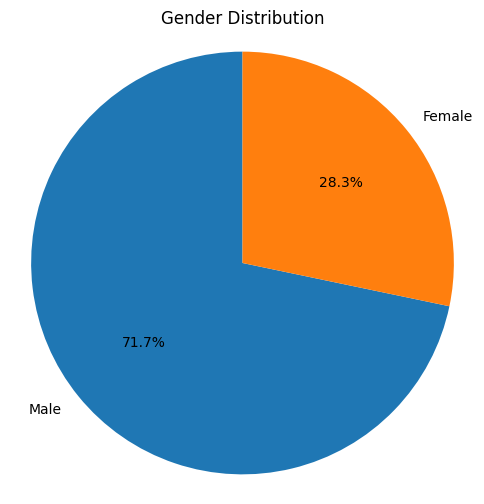

In [0]:
import matplotlib.pyplot as plt

gender_counts = df.groupBy("Gender").count().toPandas()
plt.figure(figsize=(6,6))
plt.pie(gender_counts['count'], labels=gender_counts['Gender'], autopct='%1.1f%%', startangle=90)
plt.title('Gender Distribution')
plt.axis('equal')
plt.show()

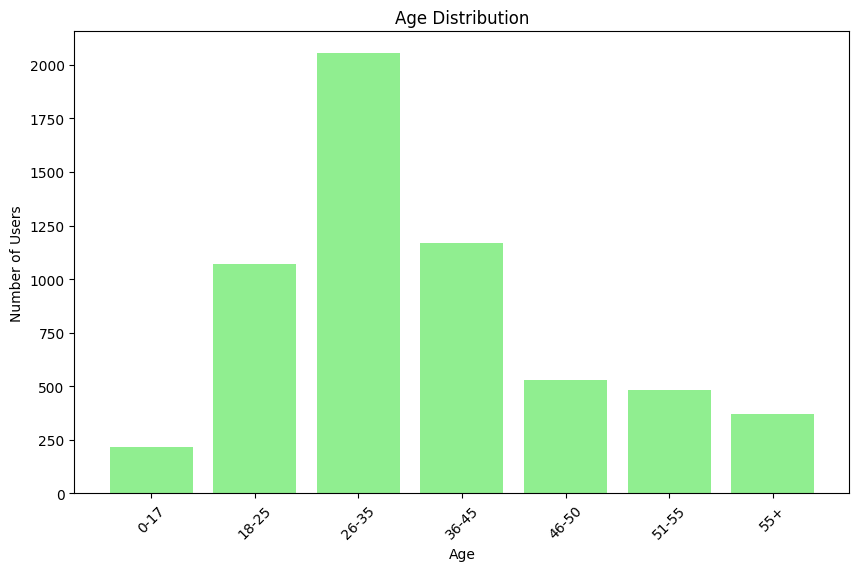

In [0]:
age_counts = df.groupBy("Age").count().orderBy("Age").toPandas()

plt.figure(figsize=(10,6))
plt.bar(age_counts['Age'], age_counts['count'], color='lightgreen')
plt.xlabel('Age')
plt.ylabel('Number of Users')
plt.title('Age Distribution')
plt.xticks(rotation=45)
plt.show()

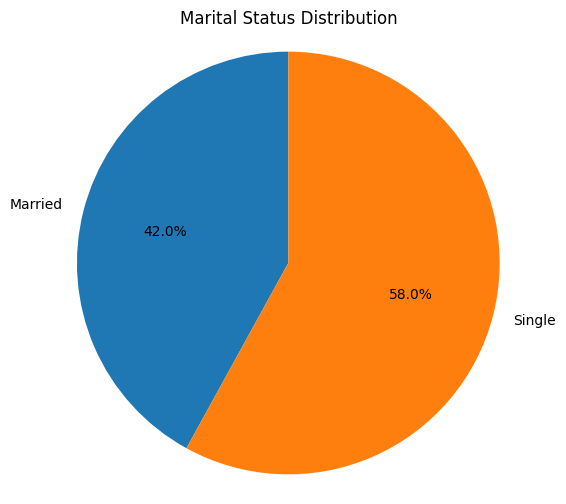

In [0]:
marital_counts = df.groupBy("Marital_Status").count().toPandas()

plt.figure(figsize=(6,6))
plt.pie(marital_counts['count'], labels=marital_counts['Marital_Status'], autopct='%1.1f%%', startangle=90)
plt.title('Marital Status Distribution')
plt.axis('equal')
plt.show()

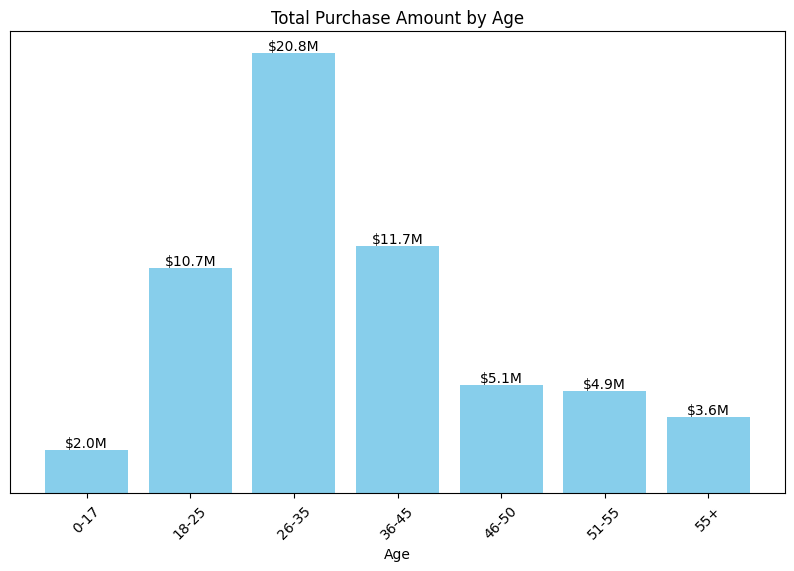

In [0]:
age_purchase = df.groupBy("Age").agg(F.sum("Purchase").alias("total_purchase")).orderBy("Age").toPandas()

def format_dollar(value):
    if value >= 1_000_000:
        return f"${value/1_000_000:.1f}M"
    elif value >= 1_000:
        return f"${value/1_000:.1f}K"
    else:
        return f"${value:.0f}"

plt.figure(figsize=(10,6))
bars = plt.bar(age_purchase['Age'], age_purchase['total_purchase'], color='skyblue')
plt.xlabel('Age')
plt.title('Total Purchase Amount by Age')
plt.xticks(rotation=45)
plt.gca().axes.get_yaxis().set_visible(False)

for bar, value in zip(bars, age_purchase['total_purchase']):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(), format_dollar(value), ha='center', va='bottom', fontsize=10)

plt.show()

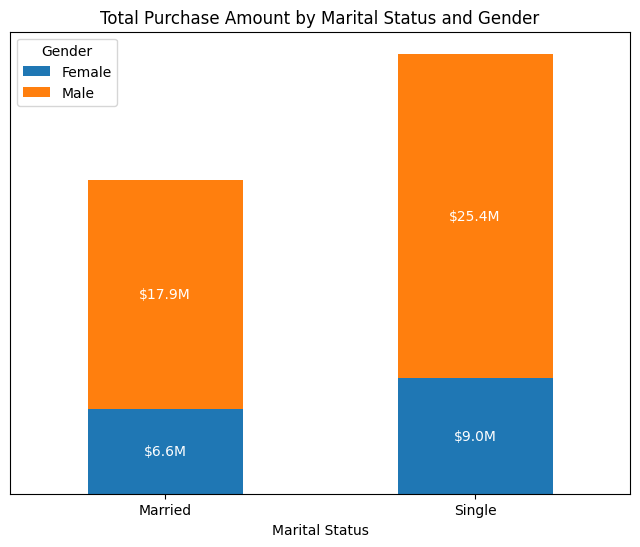

In [0]:
def format_dollar(value):
    if value >= 1_000_000:
        return f"${value/1_000_000:.1f}M"
    elif value >= 1_000:
        return f"${value/1_000:.1f}K"
    else:
        return f"${value:.0f}"

marital_gender_purchase = df.groupBy("Marital_Status", "Gender") \
    .agg(F.sum("Purchase").alias("total_purchase")) \
    .orderBy("Marital_Status", "Gender") \
    .toPandas()

pivot_df = marital_gender_purchase.pivot(index="Marital_Status", columns="Gender", values="total_purchase").fillna(0)

ax = pivot_df.plot(kind='bar', stacked=True, figsize=(8,6))
plt.xlabel('Marital Status')
plt.ylabel('Total Purchase Amount')
plt.title('Total Purchase Amount by Marital Status and Gender')
plt.legend(title='Gender')
plt.xticks(rotation=0)
ax.get_yaxis().set_visible(False)

for bars in ax.containers:
    for bar in bars:
        height = bar.get_height()
        if height > 0:
            ax.text(
                bar.get_x() + bar.get_width()/2,
                bar.get_y() + height/2,
                format_dollar(height),
                ha='center',
                va='center',
                fontsize=10,
                color='white'
            )

plt.show()

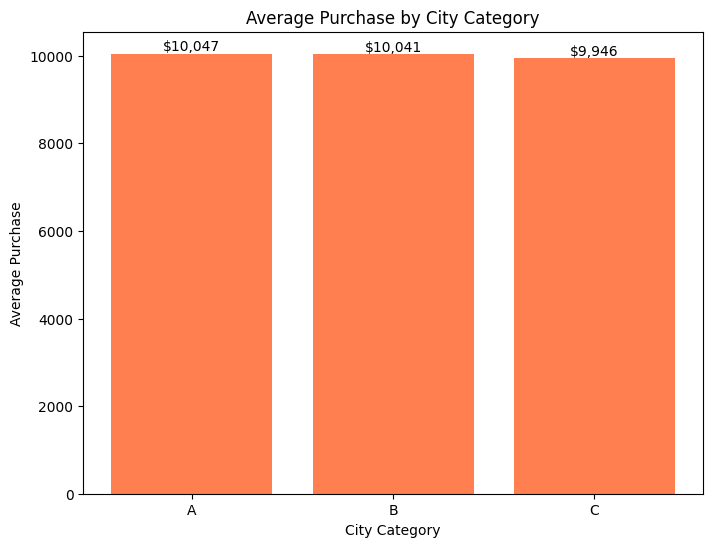

In [0]:
city_avg_purchase = df.groupBy("City_Category") \
    .agg(F.avg("Purchase").alias("avg_purchase")) \
    .orderBy(F.desc("avg_purchase")) \
    .toPandas()

plt.figure(figsize=(8,6))
bars = plt.bar(city_avg_purchase['City_Category'], city_avg_purchase['avg_purchase'], color='coral')
plt.xlabel('City Category')
plt.ylabel('Average Purchase')
plt.title('Average Purchase by City Category')
plt.xticks(rotation=0)

for bar, value in zip(bars, city_avg_purchase['avg_purchase']):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(), f"${value:,.0f}", ha='center', va='bottom', fontsize=10)

plt.show()

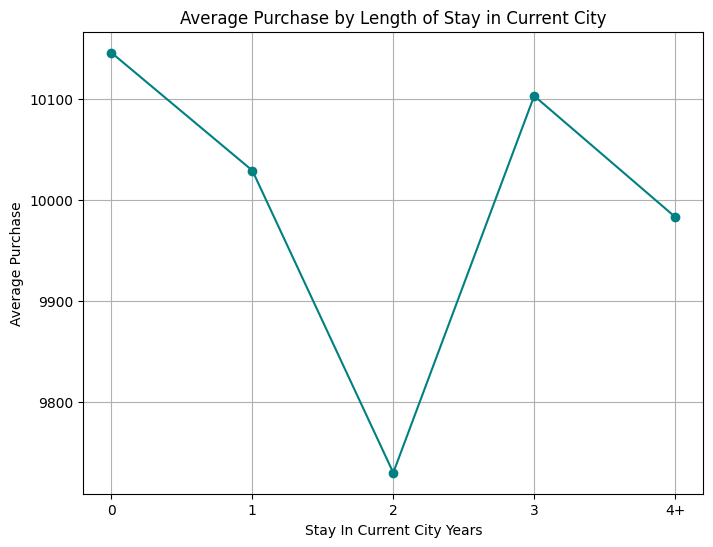

In [0]:
stay_avg_purchase = df.groupBy("Stay_In_Current_City_Years") \
    .agg(F.avg("Purchase").alias("avg_purchase")) \
    .orderBy("Stay_In_Current_City_Years") \
    .toPandas()

plt.figure(figsize=(8,6))
plt.plot(stay_avg_purchase['Stay_In_Current_City_Years'], stay_avg_purchase['avg_purchase'], marker='o', color='teal')
plt.xlabel('Stay In Current City Years')
plt.ylabel('Average Purchase')
plt.title('Average Purchase by Length of Stay in Current City')
plt.xticks(rotation=0)
plt.grid(True)
plt.show()

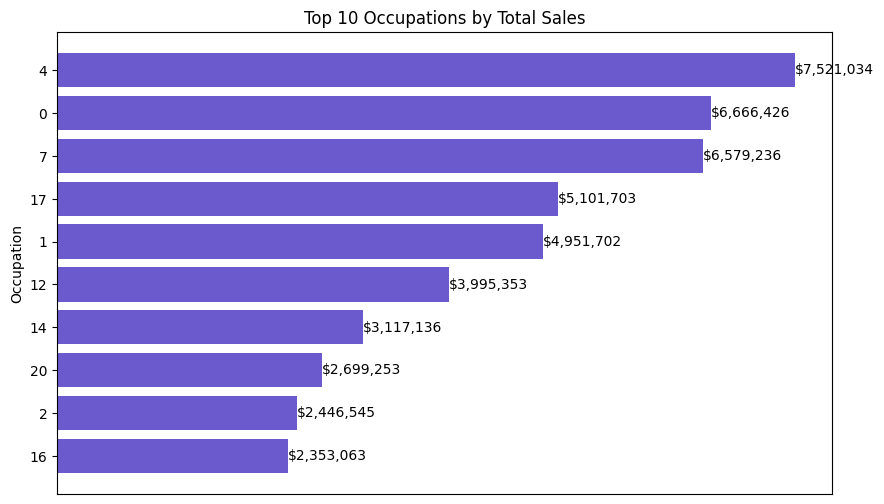

In [0]:
top_n = 10  # Change this value for more/fewer occupations

occupation_sales = df.groupBy("Occupation") \
    .agg(F.sum("Purchase").alias("total_purchase")) \
    .orderBy(F.desc("total_purchase")) \
    .limit(top_n) \
    .toPandas()

plt.figure(figsize=(10,6))
plt.barh(occupation_sales['Occupation'].astype(str), occupation_sales['total_purchase'], color='slateblue')
plt.xlabel('Total Purchase Amount')
plt.ylabel('Occupation')
plt.title(f'Top {top_n} Occupations by Total Sales')
plt.gca().invert_yaxis()
plt.gca().axes.get_xaxis().set_visible(False)

for i, value in enumerate(occupation_sales['total_purchase']):
    plt.text(value, i, f"${value:,.0f}", va='center', ha='left', fontsize=10)

plt.show()

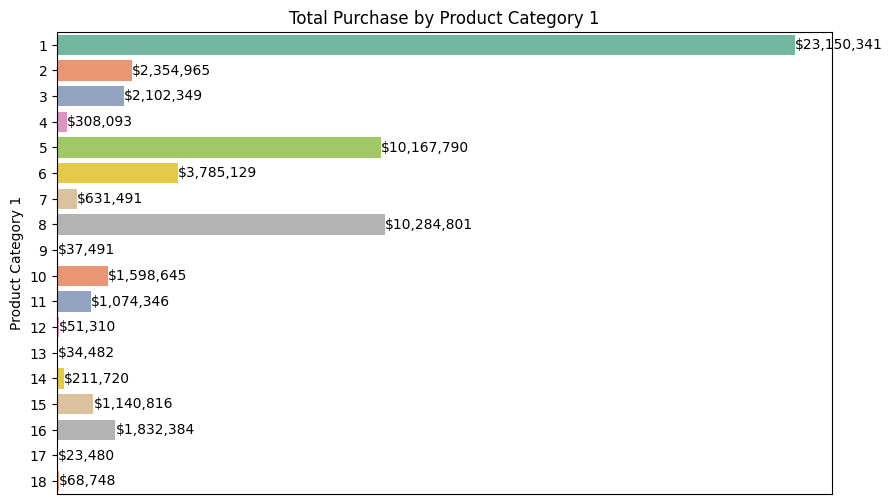

In [0]:
product_category_1_sales = df.groupBy("Product_Category_1") \
    .agg(F.sum("Purchase").alias("total_purchase")) \
    .orderBy(F.desc("total_purchase")) \
    .toPandas()

plt.figure(figsize=(10,6))
ax = sns.barplot(y='Product_Category_1', x='total_purchase', data=product_category_1_sales, palette='Set2', orient='h')
plt.ylabel('Product Category 1')
plt.xlabel('Total Purchase')
plt.title('Total Purchase by Product Category 1')
ax.get_xaxis().set_visible(False)

for p in ax.patches:
    value = p.get_width()
    if value > 0:
        ax.text(
            value,
            p.get_y() + p.get_height()/2,
            f"${value:,.0f}",
            va='center',
            ha='left',
            fontsize=10
        )

plt.show()

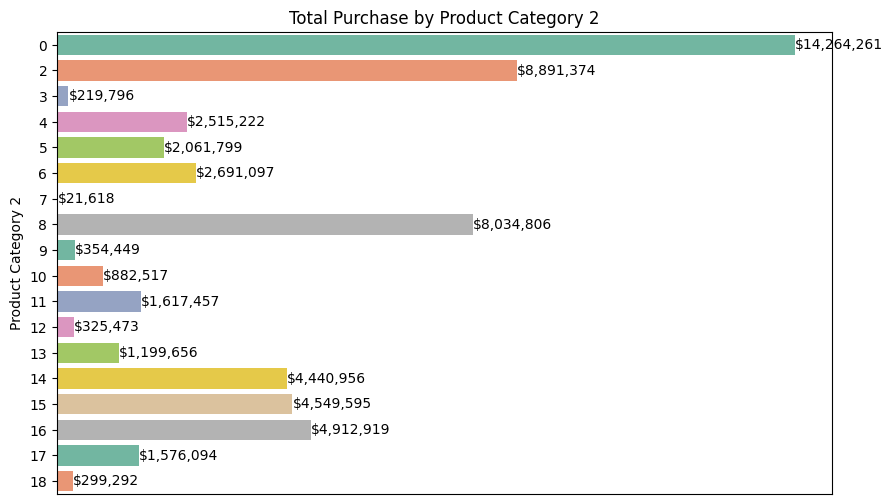

In [0]:
product_category_2_sales = df.groupBy("Product_Category_2") \
    .agg(F.sum("Purchase").alias("total_purchase")) \
    .orderBy(F.desc("total_purchase")) \
    .toPandas()

plt.figure(figsize=(10,6))
ax = sns.barplot(y='Product_Category_2', x='total_purchase', data=product_category_2_sales, palette='Set2', orient='h')
plt.ylabel('Product Category 2')
plt.xlabel('Total Purchase')
plt.title('Total Purchase by Product Category 2')
ax.get_xaxis().set_visible(False)

for p in ax.patches:
    value = p.get_width()
    if value > 0:
        ax.text(
            value,
            p.get_y() + p.get_height()/2,
            f"${value:,.0f}",
            va='center',
            ha='left',
            fontsize=10
        )

plt.show()

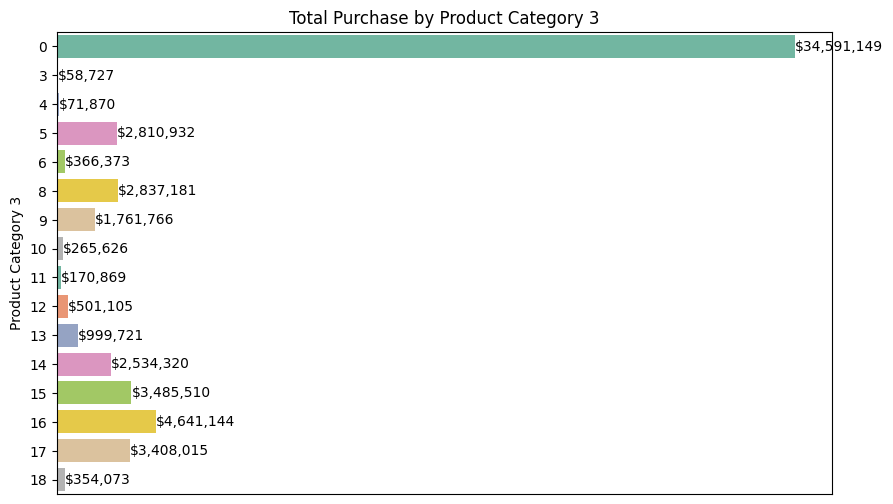

In [0]:
product_category_3_sales = df.groupBy("Product_Category_3") \
    .agg(F.sum("Purchase").alias("total_purchase")) \
    .orderBy(F.desc("total_purchase")) \
    .toPandas()

plt.figure(figsize=(10,6))
ax = sns.barplot(y='Product_Category_3', x='total_purchase', data=product_category_3_sales, palette='Set2', orient='h')
plt.ylabel('Product Category 3')
plt.xlabel('Total Purchase')
plt.title('Total Purchase by Product Category 3')
ax.get_xaxis().set_visible(False)

for p in ax.patches:
    value = p.get_width()
    if value > 0:
        ax.text(
            value,
            p.get_y() + p.get_height()/2,
            f"${value:,.0f}",
            va='center',
            ha='left',
            fontsize=10
        )

plt.show()